# Data Mining Project Dbimbing Batch 4

| Project Case |Stusy Case| Author |
| -- | -- | -- |
| Behavior Students and Learning Situation Online Class during Pandemic.| India |Adela Farah Aglia |
| | |

# INTRODUCTION



Since 2020, students in Delhi-NCR and Outside Delhi-NCR have implemented an online learning system to anticipate the spread of the COVID-19 virus.

While doing online learning occurs its changes in daily routine including lack of outdoor activity disturbed sleeping patterns, weight issues, and self-learning due to this Pandemic.

Utilizing the Data Survey, we need to find out behavior students and learning the situation in Delhi-NCR and Outside Delhi-NCR 


In [21]:
!pip3 install -U https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

!pip3 install -U pandas-profiling

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


In [22]:
# Import Library
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import re

# Plotting Usage
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# Plotting usage plotly package
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

Dataset yang diambil merupakan dataset dari :
https://www.kaggle.com/kunal28chaturvedi/covid19-and-its-impact-on-students

In [23]:
# Import Dataset
df = pd.read_csv("https://raw.githubusercontent.com/AdelaFarah13/Data-Source/main/Dbimbing/Assignment/Data%20Mining/COVID-19%20Survey%20Student%20Responses.csv")

df.head(5)

,ID,Region of residence,Age of Subject,Time spent on Online Class,Rating of Online Class experience,Medium for online class,Time spent on self study,Time spent on fitness,Time spent on sleep,Time spent on social media,Prefered social media platform,Time spent on TV,Number of meals per day,Change in your weight,Health issue during lockdown,Stress busters,Time utilized,"Do you find yourself more connected with your family, close friends , relatives ?",What you miss the most
0,R1,Delhi-NCR,21,2.0,Good,Laptop/Desktop,4.0,0.0,7.0,3.0,Linkedin,1,4,Increased,NO,Cooking,YES,YES,School/college
1,R2,Delhi-NCR,21,0.0,Excellent,Smartphone,0.0,2.0,10.0,3.0,Youtube,0,3,Decreased,NO,Scrolling through social media,YES,NO,Roaming around freely
2,R3,Delhi-NCR,20,7.0,Very poor,Laptop/Desktop,3.0,0.0,6.0,2.0,Linkedin,0,3,Remain Constant,NO,Listening to music,NO,YES,Travelling
3,R4,Delhi-NCR,20,3.0,Very poor,Smartphone,2.0,1.0,6.0,5.0,Instagram,0,3,Decreased,NO,Watching web series,NO,NO,"Friends , relatives"
4,R5,Delhi-NCR,21,3.0,Good,Laptop/Desktop,3.0,1.0,8.0,3.0,Instagram,1,4,Remain Constant,NO,Social Media,NO,NO,Travelling


Using Pandas Profiling Report for quick Exploratory Data Analysis

In [24]:
profile = ProfileReport(df, title="Pandas Profiling Report", explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1182 entries, 0 to 1181
Data columns (total 19 columns):
 #   Column                                                                              Non-Null Count  Dtype  
---  ------                                                                              --------------  -----  
 0   ID                                                                                  1182 non-null   object 
 1   Region of residence                                                                 1182 non-null   object 
 2   Age of Subject                                                                      1182 non-null   int64  
 3   Time spent on Online Class                                                          1182 non-null   float64
 4   Rating of Online Class experience                                                   1158 non-null   object 
 5   Medium for online class                                                             1131 non-null

In [26]:
df.describe()

,Age of Subject,Time spent on Online Class,Time spent on self study,Time spent on fitness,Time spent on sleep,Time spent on social media,Number of meals per day
count,1182.000000,1182.000000,1182.000000,1182.000000,1182.000000,1182.000000,1182.000000
mean,20.165821,3.208841,2.911591,0.765821,7.871235,2.365694,2.917936
std,5.516467,2.101756,2.140590,0.724451,1.615762,1.767336,0.828698
min,7.000000,0.000000,0.000000,0.000000,4.000000,0.000000,1.000000
25%,17.000000,2.000000,2.000000,0.000000,7.000000,1.000000,2.000000
50%,20.000000,3.000000,2.000000,1.000000,8.000000,2.000000,3.000000
75%,21.000000,5.000000,4.000000,1.000000,9.000000,3.000000,3.000000
max,59.000000,10.000000,18.000000,5.000000,15.000000,10.000000,8.000000


# DATA PRE-PROCESSING

## Check Missing Value

In [27]:
# Check Missing Value

df.isnull().sum().sort_values(ascending = False)/len(df)

Medium for online class                                                               0.043147
Rating of Online Class experience                                                     0.020305
What you miss the most                                                                0.000000
Time spent on sleep                                                                   0.000000
Region of residence                                                                   0.000000
Age of Subject                                                                        0.000000
Time spent on Online Class                                                            0.000000
Time spent on self study                                                              0.000000
Time spent on fitness                                                                 0.000000
Time spent on social media                                                            0.000000
Do you find yourself more connected with your fami

In [28]:
# Create dataset for value NA
df_na = df.copy()

Terdapat berapa kolom yang memiliki missing value seperti kolom **Medium for Online** dan **Rating of Online class Experience**.
Jika ditelusuri lebih dalam *kemungkinan* ada beberapa alasan kenapa kolom ini memiliki missing value, yaitu:


*   Beberapa responden siswa tidak mempunyai akses untuk melakukan kelas daring
*   Rating tidak terinput karena adanya kesalahan.





## Handling Missing Value

### Column : Medium for Online Class
Karena setelah kita check Kolom 'Medium for Online Class' mempunyai nilai nan, dan persentasenya hanya sedikit yaitu 0.043147 maka author memilih untuk membuang kolom yang memiliki nilai nan

In [29]:
#check value unique of column medium for online class
df['Medium for online class'].unique()

array(['Laptop/Desktop', 'Smartphone', 'Tablet', nan, 'Any Gadget',
       'Smartphone or Laptop/Desktop'], dtype=object)

In [30]:
# drop row who has missing values
df = df.dropna(subset=['Medium for online class'])

## Duplicate Date

In [31]:
# Mengecek isi value pada setiap kolom untuk melihat apakah ada duplikasi data
for column in df.columns:
    print(f"============= {column} =================")
    display(df[column].value_counts())
    print()

============= ID =================


R215     1
R137     1
R1085    1
R1080    1
R458     1
        ..
R1181    1
R839     1
R489     1
R158     1
R182     1
Name: ID, Length: 1131, dtype: int64


============= Region of residence =================


Delhi-NCR            688
Outside Delhi-NCR    443
Name: Region of residence, dtype: int64


============= Age of Subject =================


20    207
21    177
19    133
22     88
16     64
18     61
17     58
13     47
14     45
23     42
15     37
12     28
24     20
40     12
26     12
25     11
32     10
34      9
30      7
27      6
28      5
33      5
36      5
11      5
31      4
29      4
35      4
38      4
10      4
37      2
43      2
9       2
8       2
59      1
52      1
39      1
42      1
44      1
45      1
46      1
50      1
7       1
Name: Age of Subject, dtype: int64


============= Time spent on Online Class =================


4.00     215
2.00     191
3.00     176
5.00     141
1.00     111
0.00     106
6.00      91
8.00      31
7.00      31
0.50       9
0.75       7
9.00       5
1.50       4
10.00      4
5.50       3
2.50       2
0.70       1
3.50       1
7.50       1
0.10       1
Name: Time spent on Online Class, dtype: int64


============= Rating of Online Class experience =================


Very poor    405
Average      377
Good         223
Excellent     96
Poor          30
Name: Rating of Online Class experience, dtype: int64


============= Medium for online class =================


Laptop/Desktop                  545
Smartphone                      539
Tablet                           37
Any Gadget                        5
Smartphone or Laptop/Desktop      5
Name: Medium for online class, dtype: int64


============= Time spent on self study =================


2.0     333
3.0     198
1.0     166
4.0     146
5.0      73
0.0      72
6.0      50
8.0      26
7.0      14
10.0     14
0.5       8
2.5       7
1.5       7
12.0      5
3.5       3
9.0       2
1.2       1
17.0      1
18.0      1
6.5       1
11.0      1
4.5       1
2.3       1
Name: Time spent on self study, dtype: int64


============= Time spent on fitness =================


1.00    525
0.00    402
2.00    113
0.50     52
3.00     23
0.25      6
0.30      5
0.60      2
4.00      1
2.50      1
5.00      1
Name: Time spent on fitness, dtype: int64


============= Time spent on sleep =================


8.0     375
7.0     249
6.0     167
9.0     124
10.0     90
5.0      43
12.0     39
11.0     23
13.0      4
4.0       4
7.5       4
6.5       2
14.0      2
6.7       1
15.0      1
8.5       1
7.8       1
8.3       1
Name: Time spent on sleep, dtype: int64


============= Time spent on social media =================


1.00     332
2.00     317
3.00     164
4.00     108
5.00      56
0.00      34
0.50      31
6.00      26
1.50      15
10.00     14
7.00      10
8.00       9
0.30       4
0.10       2
0.40       2
3.50       1
0.15       1
9.00       1
0.75       1
0.25       1
0.60       1
1.30       1
Name: Time spent on social media, dtype: int64


============= Prefered social media platform =================


Instagram    335
Whatsapp     321
Youtube      306
Linkedin      57
Facebook      50
Twitter       25
None          16
Snapchat       8
Reddit         5
Telegram       3
Talklife       1
Elyment        1
WhatsApp       1
None           1
Quora          1
Name: Prefered social media platform, dtype: int64


============= Time spent on TV =================


0        428
1        288
2        198
0.5       74
3         45
4         24
1.5       14
0.3       12
5          9
6          9
N          7
0.1        4
No tv      3
8          2
2.5        2
           2
4.5        2
15         1
0.75       1
3.5        1
0.4        1
n          1
0.6        1
0.25       1
7          1
Name: Time spent on TV, dtype: int64


============= Number of meals per day =================


3    588
2    272
4    219
1     37
5      8
7      4
6      2
8      1
Name: Number of meals per day, dtype: int64


============= Change in your weight =================


Remain Constant    508
Increased          422
Decreased          201
Name: Change in your weight, dtype: int64


============= Health issue during lockdown =================


NO     972
YES    159
Name: Health issue during lockdown, dtype: int64


============= Stress busters =================


Listening to music                                           263
Online gaming                                                170
Watching web series                                           97
Reading books                                                 75
Sleeping                                                      70
                                                            ... 
Poetry, writing books and novels , listening to music too      1
Sports                                                         1
live stream watching                                           1
Cardio                                                         1
I cant de-stress myslef                                        1
Name: Stress busters, Length: 83, dtype: int64


============= Time utilized =================


NO     582
YES    549
Name: Time utilized, dtype: int64


============= Do you find yourself more connected with your family, close friends , relatives  ? =================


YES    795
NO     336
Name: Do you find yourself more connected with your family, close friends , relatives  ?, dtype: int64


============= What you miss the most =================


School/college                                                                                                                                                                                                              368
Friends , relatives                                                                                                                                                                                                         213
Travelling                                                                                                                                                                                                                  170
Roaming around freely                                                                                                                                                                                                       143
Eating outside                                                                                          

### Column: Prefered Social Media

Terdapat duplicate data kolom Prefered social media platform yaitu duplikasi value 'whastApp' dan 'None'. Maka dari itu kita akan menyamakan valuenya.

In [32]:
# Change Value Prefered social media platform column

df['Prefered social media platform'] = df['Prefered social media platform'].replace('None ', 'None').replace('Whatsapp', 'WhatsApp')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Column: Time spent on TV

Time spent on Tv seharusnya memiliki values bersihat integer, namun pada data yang kita miliki masih ada nilai string didalamnya.

maka dari itu, kita akan melakukan generalisasi pada kolom Time Spent on Tv

Nilai yang bersifat No Tv, n, N, ' ' menunjukan mereka tidak melakukan kegiatan menonton tv maka kita akan mengganti nilai nya menjadi 0

In [33]:
# Change value column Time spent on Tv
df['Time spent on TV'].replace('No tv', 0, inplace=True)
df['Time spent on TV'].replace('n', 0, inplace=True)
df['Time spent on TV'].replace('N', 0, inplace=True)
df['Time spent on TV'].replace(' ', 0, inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4582: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Column: What you miss the most

Kolom ini termasuk yang mempunyai duplicate dan format yang berantakan, maka dari itu author akan mencoba untuk membersihkannya menggunakan regex

In [34]:
df['What you miss the most'].value_counts()

School/college                                                                                                                                                                                                              368
Friends , relatives                                                                                                                                                                                                         213
Travelling                                                                                                                                                                                                                  170
Roaming around freely                                                                                                                                                                                                       143
Eating outside                                                                                          

In [35]:
# Mengubah string menjadi lowercase
df['What you miss the most'] = df['What you miss the most'].map(lambda x: x.lower() if isinstance(x,str) else x)


#================================================================================================================
#  Mengubah setiap baris yang mempunyai kata 'all' dan 'everything' menjadi all
#================================================================================================================

df['What you miss the most'] = list(map(lambda x : 'all' if any(item in x for item in['all','everything'])
                                    else x, df['What you miss the most']))

#=================================================================================================================
# Mengubah tanda '&','and' menjadi ','
#==================================================================================================================

df['What you miss the most']=df['What you miss the most'].str.replace(r'&|and', ',')

#==================================================================================================================
# Menghapus space di depan string
#==================================================================================================================

df['What you miss the most']=df['What you miss the most'].str.replace('\A ', '')

#==================================================================================================================
# Menghapus spasi yang ada di depan dan dibelakang ','
#==================================================================================================================

df['What you miss the most']=df['What you miss the most'].str.replace(r'\s*,\s*', ',')

#==================================================================================================================
# Mengubah kalimat yang merujuk kata nothing
#==================================================================================================================

df['What you miss the most'] = list(map(lambda x : 'nothing' if any(item in x for item in['nothing','lazy'])
                                else x, df['What you miss the most']))
df['What you miss the most']=df['What you miss the most'].str.replace('i have missed nothing', 'nothing')\
                                                             .replace(r'.', 'nothing')

#==================================================================================================================
# Menghapus tanda .
#==================================================================================================================

df['What you miss the most']=df['What you miss the most'].str.replace(r'(\w)\.', r'\1')

#==================================================================================================================
# Mengubah kalimat yang merujuk friend,school
#==================================================================================================================
df['What you miss the most']=df['What you miss the most'].str.replace('school,friends', 'friend,school')\
                                                             .replace('friends,school', 'friend,school')\
                                                             .replace('school,my school friends','friend,school')
df['What you miss the most']=df['What you miss the most'].str.replace(r'only friends', 'friends,relatives')

#==================================================================================================================
# Mengubah kalimat yang merujuk family
#==================================================================================================================
df['What you miss the most'] = list(map(lambda x : 'family' if any(item in x for item in['family']) 
                                                            else x, df['What you miss the most']))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/

In [36]:
# Melihat Nilai yang sudah dihilangkan duplikasinya
df['What you miss the most'].value_counts()

school/college                   368
friends,relatives                215
travelling                       170
roaming around freely            143
eating outside                    99
colleagues                        66
all                               27
nothing                           19
gym                                4
friend,school                      3
family                             2
friends,romaing,traveling          1
metro                              1
to stay alone                      1
friends,roaming around freely      1
school,relatives,friends           1
travelling,friends                 1
being social                       1
taking kids to park                1
friends,relatives,travelling       1
going to the movies                1
badminton in court                 1
eating outside,friends             1
job                                1
my normal routine                  1
playing                            1
Name: What you miss the most, dtype: i

## Data Tranformation

Pada tahap ini author akan melakukan manipulasi pada data dengan tujuan untuk mendapatkan informasi baru untuk mendukung anasis yang akan di buat oleh author.


In [37]:
#=============================================================================================================================
# Change Data type
#=============================================================================================================================
df['Time spent on TV'] = df['Time spent on TV'].astype(float)
#=============================================================================================================================
# Identifikasi student grade by age
#=============================================================================================================================
conditions = [
    (df['Age of Subject'] <= 12),
    (df['Age of Subject'] >= 13) & (df['Age of Subject'] <= 15),
    (df['Age of Subject'] >= 16) & (df['Age of Subject'] <= 18),
    (df['Age of Subject'] >= 19)
    ]

# create a list of the values we want to assign for each condition
values = ['ES', 'JHS', 'SHS', 'College']

# create a new column and use np.select to assign values to it using our
# lists as arguments
df["Subject Level of school"] = np.select(conditions, values )

#=============================================================================================================================
# Makes new column, Is student have normal time of sleep?
#=============================================================================================================================


Conditions = [
    (df["Subject Level of school"] == "ES") & (  (df["Time spent on sleep"] >=9) & (df["Time spent on sleep"] <=12)  ) ,
    (df["Subject Level of school"] == "JHS") & (  (df["Time spent on sleep"] >=8) & (df["Time spent on sleep"] <=10)  ) ,
    (df["Subject Level of school"] == "SHS") & (  (df["Time spent on sleep"] >=8) & (df["Time spent on sleep"] <=10)  ) ,
    (df["Subject Level of school"] == "College") & (  (df["Time spent on sleep"] >=7) & (df["Time spent on sleep"] <=10)  ) ,
    ]

Value = [
    "YES","YES","YES","YES"
]

df["Is student has normal time sleep?"] = np.select(Conditions,Value, default = "NO")

#=============================================================================================================================
# Make new column, entertainment
#=============================================================================================================================
df['Time for Entertainment'] = df["Time spent on social media"] + df["Time spent on TV"]

#=============================================================================================================================
# Makes new column is student spent more time on Entertainment Media than self study?
#=============================================================================================================================
Conditions = [
    df["Time for Entertainment"] > df["Time spent on self study"]
]

Value = [
    "YES"
]

df["Is student spent more time on Entertainment than self study?"] =  np.select(Conditions,Value, default="NO")

#=============================================================================================================================
# Make new column, Total Time Study
#=============================================================================================================================
df["Total time of study"] = df["Time spent on Online Class"] + df["Time spent on self study"]

#=============================================================================================================================
# Create New column 'Numeric Rating Class'
#=============================================================================================================================
#Create a new column 'Numeric Rating Class'
df.loc[df['Rating of Online Class experience'] == 'Very poor', 'Numeric Rating Class'] = '1'
df.loc[df['Rating of Online Class experience'] == 'Poor', 'Numeric Rating Class'] = '2'
df.loc[df['Rating of Online Class experience'] == 'Average', 'Numeric Rating Class'] = '3'
df.loc[df['Rating of Online Class experience'] == 'Good', 'Numeric Rating Class'] = '4'
df.loc[df['Rating of Online Class experience'] == 'Excellent', 'Numeric Rating Class'] = '5'

#Convert string to integer
pd.to_numeric(df['Numeric Rating Class'])

#=============================================================================================================================
# Membuat list kondisi kolom 'change in your weight'
#=============================================================================================================================
conditions = [
    (df['Change in your weight'] == 'Increased'),
    (df['Change in your weight'] == 'Decreased'),
    (df['Change in your weight'] == 'Remain Constant')
]

# Membuat list nilai yang ingin kita masukkan 
values = ['1', '-1', '0']

# Membuat kolom baru dengan bantuan nummpy

df['Numeric Change in Weight'] = np.select(conditions, values)

#Convert string to integer
pd.to_numeric(df['Numeric Change in Weight'])

df[['Numeric Rating Class', 'Numeric Change in Weight']] = df[['Numeric Rating Class', 'Numeric Change in Weight']].apply(pd.to_numeric)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:38: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/

In [38]:
df.head(5)

,ID,Region of residence,Age of Subject,Time spent on Online Class,Rating of Online Class experience,Medium for online class,Time spent on self study,Time spent on fitness,Time spent on sleep,Time spent on social media,Prefered social media platform,Time spent on TV,Number of meals per day,Change in your weight,Health issue during lockdown,Stress busters,Time utilized,"Do you find yourself more connected with your family, close friends , relatives ?",What you miss the most,Subject Level of school,Is student has normal time sleep?,Time for Entertainment,Is student spent more time on Entertainment than self study?,Total time of study,Numeric Rating Class,Numeric Change in Weight
0,R1,Delhi-NCR,21,2.0,Good,Laptop/Desktop,4.0,0.0,7.0,3.0,Linkedin,1.0,4,Increased,NO,Cooking,YES,YES,school/college,College,YES,4.0,NO,6.0,4,1
1,R2,Delhi-NCR,21,0.0,Excellent,Smartphone,0.0,2.0,10.0,3.0,Youtube,0.0,3,Decreased,NO,Scrolling through social media,YES,NO,roaming around freely,College,YES,3.0,YES,0.0,5,-1
2,R3,Delhi-NCR,20,7.0,Very poor,Laptop/Desktop,3.0,0.0,6.0,2.0,Linkedin,0.0,3,Remain Constant,NO,Listening to music,NO,YES,travelling,College,NO,2.0,NO,10.0,1,0
3,R4,Delhi-NCR,20,3.0,Very poor,Smartphone,2.0,1.0,6.0,5.0,Instagram,0.0,3,Decreased,NO,Watching web series,NO,NO,"friends,relatives",College,NO,5.0,YES,5.0,1,-1
4,R5,Delhi-NCR,21,3.0,Good,Laptop/Desktop,3.0,1.0,8.0,3.0,Instagram,1.0,4,Remain Constant,NO,Social Media,NO,NO,travelling,College,YES,4.0,YES,6.0,4,0


# EXPLORE THE DATA

In accordance with the author's purpose, he wanted to know the situation of Online learning and Behavior of Students in New Delhi and Outside New Delhi during the covid-19 pandemic, namely:

1. What is the current situation during Online learning in the pandemic? 
2. What are the eating patterns of students during Online learning during the pandemic? 
3. How were students' sleep patterns during the pandemic?
4. Do students prefer self-learning over entertainment?
5. What do the students miss the most?




In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1131 entries, 0 to 1181
Data columns (total 26 columns):
 #   Column                                                                              Non-Null Count  Dtype  
---  ------                                                                              --------------  -----  
 0   ID                                                                                  1131 non-null   object 
 1   Region of residence                                                                 1131 non-null   object 
 2   Age of Subject                                                                      1131 non-null   int64  
 3   Time spent on Online Class                                                          1131 non-null   float64
 4   Rating of Online Class experience                                                   1131 non-null   object 
 5   Medium for online class                                                             1131 non-null

In [40]:
profile_After = ProfileReport(df, title="Pandas Profiling Report", explorative=True)
profile_After

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Learning situations during Pandemic

##  What is the current situation during Online learning in the pandemic? 

Time Spent Online Learning by Grade

In [42]:
import plotly.io as pio

fig_dict = make_subplots(rows=1, cols= 2)

aggs = ["count","sum","avg","median","mode","rms","stddev","min","max","first","last"]

agg = []
agg_func = []
for i in range(0, len(aggs)):
    agg = dict(
        args=['transforms[0].aggregations[0].func', aggs[i]],
        label=aggs[i],
        method='restyle'
    )
    agg_func.append(agg)

data = [dict(
    type= 'scatter',
    x= df['Subject Level of school'],
    y= df['Time spent on Online Class'], 
    mode = 'lines+markers',
    transforms = [dict(
        type = 'aggregate',
        groups = df['Subject Level of school'],
        aggregations = [dict(
            target = 'y', func ='avg', enabled= True
        ),]
    )]
)]

layout = dict(
  title = '<b>Time Spent on Onlince Class by Grade Level</b><br>use dropdown to change aggregation',
  xaxis = dict(title = 'Subject Level of school', 
               #category_order = 'array',
               #categoryarray = ['ES','JHS', 'SHS','College'],
               ),
  yaxis = dict(title = 'Time spent on Online Class', range = [0,12]),
  updatemenus = [dict(
        x = 0.85,
        y = 1.15,
        xref = 'paper',
        yref = 'paper',
        yanchor = 'top',
        active = 1,
        showactive = False,
        buttons = agg_func
  )]
)


fig_dict = dict(data=data, layout=layout)



pio.show(fig_dict, validate=False)

Based on the Grade level, students who spend the most time on online classes, it's JHS, have an average of 4.3 hours/day and SHS 4.2 hours/day. 

The unique fact is, which colleges have higher school grades than others have the lowest learning averages. Maybe it can be related to the college learning system in the form of credits(SKS) and not during other school-level learning times.

In [43]:
fig = px.violin(df,
             x='Subject Level of school',
             y='Time spent on Online Class',
             category_orders={"Subject Level of school":['ES','JHS', 'SHS','College']}
)

fig.update_layout(
    title =dict(
        text = 'Violin plot of Time Spent on Onlince Class by Grade Level',
        x=0.5,
        xanchor='center'
    )
)
pio.show(fig, validate=False)

Using a violin chart, we can see the spread of the data. Even if they are in the same School Level. However, it can be concluded that every School level does not have basic rules in managing their students' online learning study hours. Because every student has a lot of time variations in online learning.

### Devices that students use during Online Learning

In [44]:
device = df['Medium for online class'].value_counts().reset_index()
device

,index,Medium for online class
0,Laptop/Desktop,545
1,Smartphone,539
2,Tablet,37
3,Any Gadget,5
4,Smartphone or Laptop/Desktop,5


In [45]:
# Create Visualization of Device Learning

fig = px.pie(device, values='Medium for online class', names='index')

fig.update_layout(
    title = {
        'text' :'What devices they use for Online Learning?',
        'xanchor' : 'center',
        'yanchor' : 'auto',
        'x' : 0.45       
    }
)

fig.update_traces( textinfo='percent+label')

fig.show()

Devices are one of the main supports in conducting Online Learning during the pandemic. There are two favorite devices of students in conducting online learning, Laptop/Desktop 48.2% and Smartphone 47.7%

### Rating Class by level of School

In [46]:
import plotly.io as pio

fig_dict = make_subplots(rows=1, cols= 2)

aggs = ["count","sum","avg","median","mode","rms","stddev","min","max","first","last"]

agg = []
agg_func = []
for i in range(0, len(aggs)):
    agg = dict(
        args=['transforms[0].aggregations[0].func', aggs[i]],
        label=aggs[i],
        method='restyle'
    )
    agg_func.append(agg)

data = [dict(
    type= 'scatter',
    x= df['Subject Level of school'],
    y= df['Numeric Rating Class'], 
    #color =df['Mental Health issue during lockdown'],
    mode = 'lines+markers',
    transforms = [dict(
        type = 'aggregate',
        groups = df['Subject Level of school'],
        aggregations = [dict(
            target = 'y', func ='avg', enabled= True
        ),]
    )]
)]

layout = dict(
  title = '<b>Rating Onlince Class by Grade Level</b><br>use dropdown to change aggregation',
  xaxis = dict(title = 'Subject Level of school', 
               #category_order = 'array',
               #categoryarray = ['ES','JHS', 'SHS','College'],
               ),
  yaxis = dict(title = 'Rating Class Online Class'),
  updatemenus = [dict(
        x = 0.85,
        y = 1.15,
        xref = 'paper',
        yref = 'paper',
        yanchor = 'top',
        active = 1,
        showactive = False,
        buttons = agg_func
  )]
)


fig_dict = dict(data=data, layout=layout)



pio.show(fig_dict, validate=False)

In giving rating classes during online learning, Elementary School students occupy the best quality positions in online learning and colleges get the worst rating.

it makes college student has worst Online Class quality, based on time spent of Online class, and Rating of Online Class .


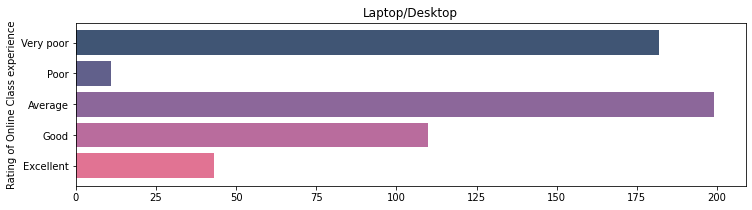

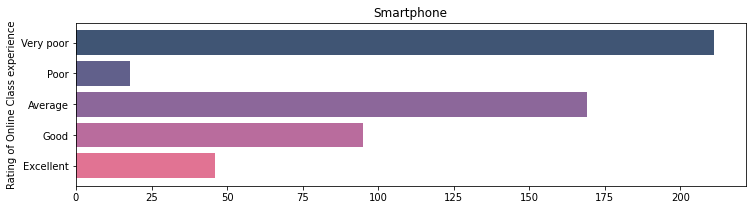

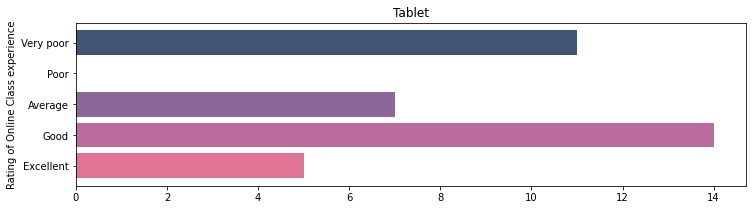

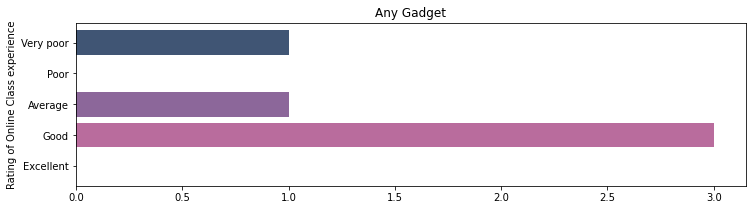

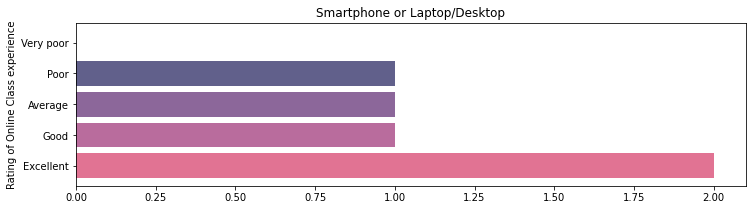

In [47]:
#Define a list that contains all the medium types
medium = df['Medium for online class'].unique()  

#Define a list that contains all the ratings
rating_index = ['Excellent','Good','Average','Poor','Very poor']

#Create a color palette
palette = ['#E17393', '#B96C9D', '#8C679A', '#61608B', '#405574']

#Create a loop that iterates each medium type
for type in medium:
    ax=df.loc[(df['Medium for online class']== type)].groupby(by='Rating of Online Class experience').ID.count()
    ax.reindex(rating_index).plot.barh(title=type, width=0.8, color=palette, figsize=(12,3))
    plt.show()

In [48]:
fig = px.histogram(df,
             facet_col='Rating of Online Class experience',
             x='Subject Level of school',
             barmode="group",
             category_orders={"Subject Level of school":['ES','JHS', 'SHS','College'],
                              "Rating of Online Class experience":['Very poor','Poor','Good','Average','Excellent']
                              })

fig.update_layout(
    title =dict(
        text = 'Rating Online Class',
        x=0.5,
        xanchor='center',   
    )
    
)

fig.show()

## What are the eating patterns of students during Online learning in the   pandemic situation? 

In [49]:
fig = px.histogram(df,
             x="Subject Level of school",
             color="Change in your weight",
             #y='Time spent on fitness',
             barmode="group", facet_col='Number of meals per day',
             facet_col_wrap=4,
             category_orders={"Number of meals per day":[1,2,3,4,5,6,7,8],
                              "Subject Level of school":['ES','JHS', 'SHS','College'],
                              }
)


fig.update_layout(
    title =dict(
        text = 'Students eating behavior during Online Class Learning',
        x=0.5,
        xanchor='center',
    ),
)



fig.update_xaxes(dividerwidth= 2)

fig.show()

During a pandemic, students have a variety of eating patterns. However, still, ideally, they eat 3-4 times a day. The amount they eat per day also affects changes in student body weight. However, this change can also be affected by their sports activities during the pandemic (Time spent on Fitness)

 Time spent on Self study

In [50]:
import plotly.io as pio

fig_dict = make_subplots(rows=1, cols= 2)

aggs = ["count","sum","avg","median","mode","rms","stddev","min","max","first","last"]

agg = []
agg_func = []
for i in range(0, len(aggs)):
    agg = dict(
        args=['transforms[0].aggregations[0].func', aggs[i]],
        label=aggs[i],
        method='restyle'
    )
    agg_func.append(agg)

data = [dict(
    type= 'scatter',
    x= df['Subject Level of school'],
    y= df['Time spent on self study'], 
    #color =df['Mental Health issue during lockdown'],
    mode = 'lines+markers',
    transforms = [dict(
        type = 'aggregate',
        groups = df['Subject Level of school'],
        aggregations = [dict(
            target = 'y', func ='avg', enabled= True
        ),]
    )]
)]

layout = dict(
  title = '<b>Time spent on self study</b><br>use dropdown to change aggregation',
  xaxis = dict(title = 'Subject Level of school', 
               #category_order = 'array',
               #categoryarray = ['ES','JHS', 'SHS','College'],
               ),
  yaxis = dict(title = 'Time spent on self study'),
  updatemenus = [dict(
        x = 0.85,
        y = 1.15,
        xref = 'paper',
        yref = 'paper',
        yanchor = 'top',
        active = 1,
        showactive = False,
        buttons = agg_func
  )]
)


fig_dict = dict(data=data, layout=layout)



pio.show(fig_dict, validate=False)

## How were students' sleep patterns during the pandemic?

In [51]:
fig = px.histogram(df,
             x='Is student has normal time sleep?',
             facet_col='Subject Level of school',
             barmode="group",
             category_orders={"Subject Level of school":['ES','JHS', 'SHS','College']})

fig.update_layout(
    title =dict(
        text = 'Students sleeping behavior by Grade School',
        x=0.5,
        xanchor='center',   
    )
    
)

fig.show()

## Do students prefer self-learning over entertainment?

In [52]:
fig = px.histogram(df,
             x='Is student spent more time on Entertainment than self study?',
             color='Subject Level of school',
             barmode="group",
             category_orders={"Subject Level of school":['ES','JHS', 'SHS','College']})

fig.update_layout(
    title =dict(
        text = 'Is student spent more time on Entertainment than Study?',
        x=0.5,
        xanchor='center',   
    )
    
)

fig.show()

Students on each level of school prefer self-learning over entertainment but not significant. This means they need refreshing or entertainment such as playing social media and watching TV.

## What do the students miss the most?

In [53]:
what_miss =  df.groupby(['What you miss the most']).size().to_frame().sort_values([0],ascending=False).head(10).reset_index()
what_miss.columns =['What you miss the most','count']

In [54]:
fig = px.bar(what_miss,
             x='What you miss the most',
             color='What you miss the most',
             y='count')
fig.update_layout(
    title =dict(
        text = 'What do the students miss the most?',
        x=0.5,
        xanchor='center',   
    )
    
)
fig.show()

The activity they miss most is going back to school and their friends.
This means that the offline school experience is more attractive to students than doing online school learning.

# Conclusion and Recommendation


---
**Conclusion :**



*   In India, Online Learning still has a bad learning experience for some students.
*   Even though students are busy online class learning, the majority of them still maintain their eating patterns.
*   A small number of students have benefited from this Online learning during pandemics, such as a lot of study time, accustomed to using devices for online learning.
*   Unfortunately, some elementary schools and junior high schools have abnormal sleep hours. Though the hours of sleep is one of the main things in the period of growth.
*  Students really miss their usual activities before the pandemic such as going to school and interacting with friends. This also causes some of them to use their time to play social media and watch TV as their entertainment material.


**Recommendation:**


1.   If online learning continues for a long time, the quality of online classes must be improved and more attractive so that students do not lose their enthusiasm for learning it can be proper training of educators for the digital skills and improved student-teacher interaction must be conducted. 
2.   Preferably, there is a policy in regulating online study hours, especially for Elementary School students. They have excessive school time and this can have an impact on their sleep patterns because time is wasted studying in class.
3.   Opened school activities are held in stages so that students can return to their usual activities if the average number of students has received the vaccination.





